In [ ]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pylab as plt
import cv2
from matplotlib import image
import os
import numpy as np
from scipy import ndimage
from scipy.ndimage import morphology
import mach_functions


In [2]:
Image = cv2.imread('./TestImages/n2018-07-28-1787-S3.png')

In [3]:
cleandImage = mach_functions.cleanImage(Image)

In [4]:
rgbImage = cv2.cvtColor(cleandImage,cv2.COLOR_BGR2RGB)

In [5]:
grayImage = mach_functions.invertGrayImage(cleandImage)

In [6]:
yamlFile = "Params.yaml"
Params = mach_functions.load_yaml(yamlFile)
Filters = mach_functions.readInfilters(Params)

In [7]:
import pickle

In [8]:
with open("testWholeImage","rb") as f:
    allresults = pickle.load(f)

with open("testSmallImages","rb") as f:
    smallImages = pickle.load(f)

with open("testSmallImagesGrayScale","rb") as f:
    smallImageGrayScale = pickle.load(f)

In [11]:
from scipy.ndimage import measurements

In [28]:
def getWholeImageResults(allresults,smallImages):
    """
    show the results for whole image detection
    """
    cases = ['ram','rod','amoe','hyp','dys']
    colors =  {'ram': 'green',
               'rod': 'red',
                'amoe': 'cyan',
                'hyp': 'blue',
                'dys': 'yellow'
                        }
    cellNums = []
    resultsImage = []
    for i in range(len(allresults)):
        tempImage = smallImages[i].copy()
        cellnum = dict()
        for j in cases:
            dumy, nGroup = measurements.label(allresults[i][j])
            cellnum[j] = nGroup
            tempImage = mach_functions.pasteImage(tempImage,allresults[i][j],colors[j])
        resultsImage.append(tempImage)
        cellNums.append(cellnum)
        

    return resultsImage, cellNums

In [35]:
print (CellNum[30]['ram'])

2


In [29]:
resultImamge, CellNum = getWholeImageResults(allresults,smallImages)

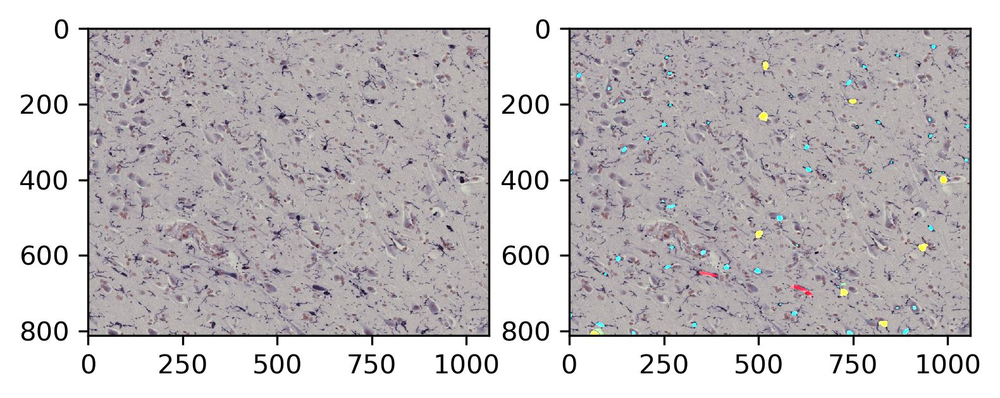

In [33]:
plt.figure(dpi=300)
plt.subplot(1,2,1)
plt.imshow(smallImages[30])
plt.subplot(1,2,2)
plt.imshow(resultImamge[30])

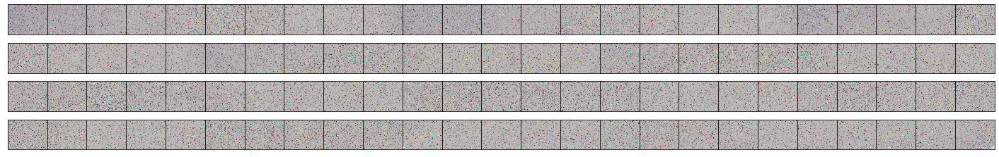

In [31]:
mach_functions.displayMultImage(resultImamge,numbering=False)

In [12]:
for i in range(100):
    labels, nGroups = measurements.label(allresults[i]['ram'])
    print (nGroups)

0
0
0
1
10
3
3
1
0
0
2
4
0
1
5
0
5
1
0
3
0
0
4
6
8
2
2
2
3
0
2
1
7
8
7
4
1
3
1
1
1
6
4
8
3
7
2
0
1
1
9
2
12
23
5
1
0
2
4
8
3
4
3
2
0
2
5
0
0
5
4
1
3
5
12
3
3
0
2
1
7
12
10
4
6
5
0
0
1
4
2
0
0
3
0
3
2
6
2
4


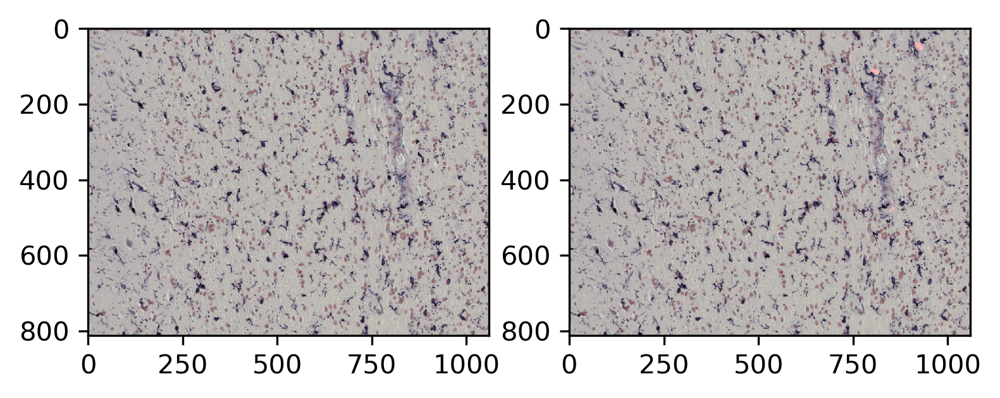

In [18]:
plt.figure(dpi=300)
plt.subplot(1,2,1)
plt.imshow(smallImages[4])
plt.subplot(1,2,2)
plt.imshow(cimage)


In [17]:
cimage = mach_functions.pasteImage(smallImages[4],allresults[4]['ram'],'red')

In [9]:
detectedrodcells, Crplanes = mach_functions.giveRod(ttimage,Filters['NormalFilters']['rod'],Filters['PenaltyFilters']['rrodp'],\
                                                    snrthres=0.27,fragRodRefine=False,areaRefine=False)

In [10]:
fragrodcells, Crplanes2 = mach_functions.giveRod(ttimage,Filters['NormalFilters']['rod'],Filters['PenaltyFilters']['rrodp'],\
                                                    snrthres=0.27,fragRodRefine=True,\
                                                        somaFilter=Filters['NormalFilters']['amoe'],
                                                        somathres=0.33,areaRefine=False
                                                        )

In [17]:
fragandarearodcells, Crplanes3 = mach_functions.giveRod(ttimage,Filters['NormalFilters']['rod'],Filters['PenaltyFilters']['rrodp'],\
                                                    snrthres=0.27,fragRodRefine=True,\
                                                        somaFilter=Filters['NormalFilters']['amoe'],
                                                        somathres=0.33,areaRefine=True,\
                                                        areathres=0.03
                                                        )

In [18]:
colorImage = mach_functions.pasteImage(Image[1000:2000,1000:2000],detectedrodcells,'red')
ncolorImage = mach_functions.pasteImage(Image[1000:2000,1000:2000],fragrodcells,'red')
nncolorImage = mach_functions.pasteImage(Image[1000:2000,1000:2000],fragandarearodcells,'red')


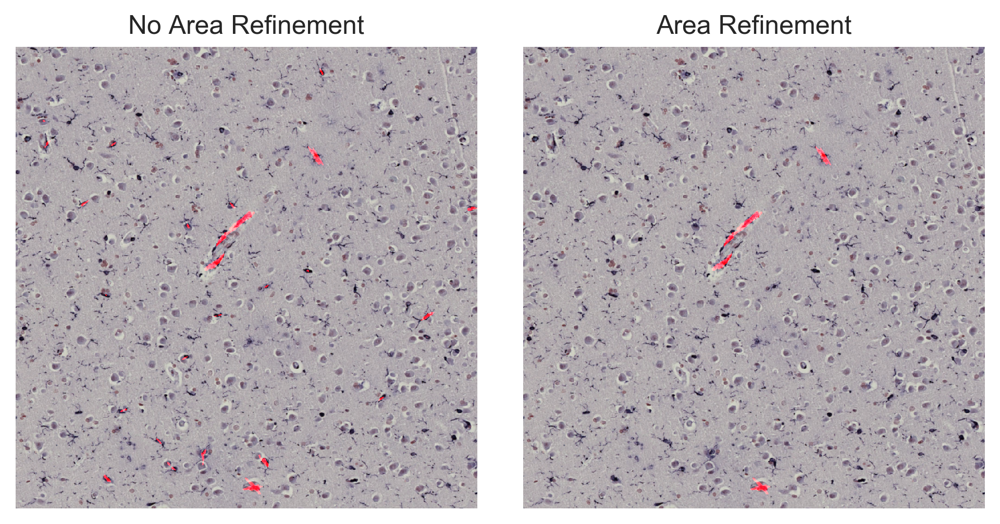

In [22]:
plt.style.use('seaborn')
plt.figure(dpi=300)

#plt.subplot(1,2,1)
#plt.imshow(Image[1000:2000,1000:2000])
#plt.xticks([])
#plt.yticks([])
plt.subplot(1,2,1)
plt.title('No Area Refinement')
plt.imshow(ncolorImage)
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(nncolorImage)
plt.title('Area Refinement')
plt.xticks([])
plt.yticks([])
plt.subplots_adjust(hspace=0,wspace=0.1)
plt.savefig('rod.png')




In [8]:
cImage = mach_functions.pasteImage(Image[1000:2000,1000:2000],detectedrodcells,'red')

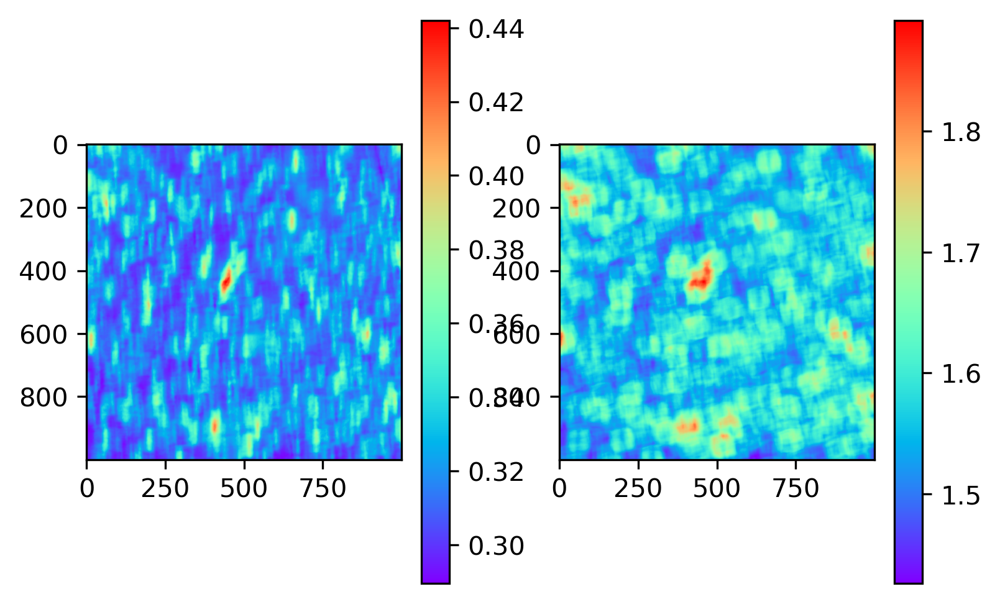

In [13]:
plt.figure(dpi=300)
plt.subplot(1,2,1)
plt.imshow(Crplanes[20][0],cmap='rainbow')
plt.colorbar()
plt.subplot(1,2,2)
plt.imshow(Crplanes[20][1],cmap='rainbow')
plt.colorbar()

In [16]:
oriImage = Image[1000:2000,1000:2000]
goriImage = mach_functions.addGrid(oriImage)
gcImage = mach_functions.addGrid(cImage)

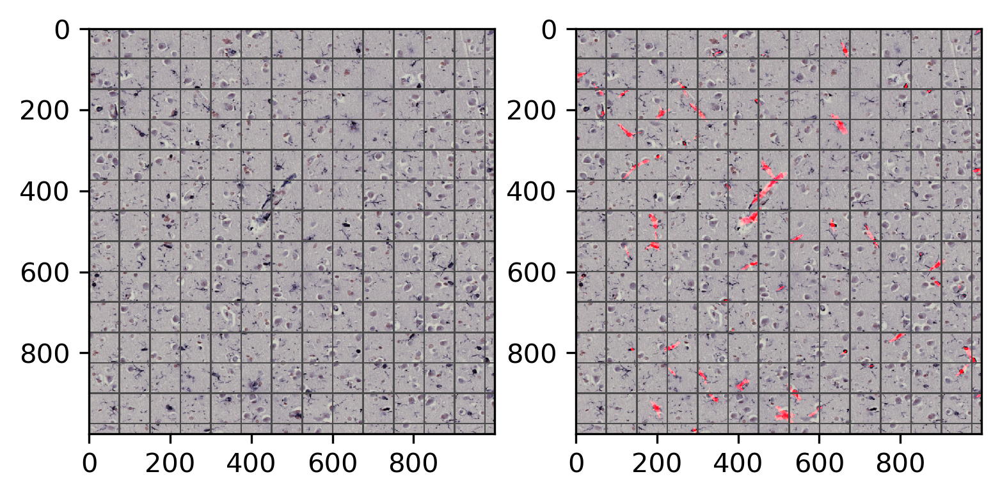

In [17]:
plt.figure(dpi=300)
plt.subplot(1,2,1)
plt.imshow(goriImage)

plt.subplot(1,2,2)
plt.imshow(gcImage)

In [41]:
results = runFiltering("./Params.yaml")


using the 'rrodp' as penalty filter for rod cell detection
Detecting the rod cells ---
Detecting the ram/hyp cells ---
Detecting the amoe/dys cells ---


get the performace score defined as $f = \sum W_{TP,i} (1-TP_i) + W_{FP,i}FP_i$ and save the TP/FP into a figure

rod
ram
hyp
amoe
dys


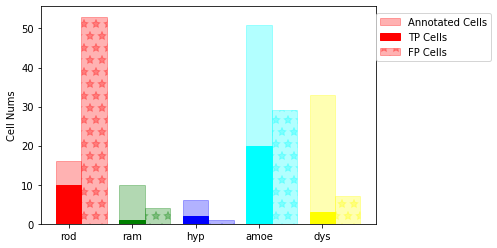

In [42]:
results.resetTPFPWeights()
results.calculateTPFP()
PFscore = results.calculatePFscore()
results.plotTPFPfigure("TPFP.png")

In [43]:
print (PFscore)

8.118516042780747
